In [0]:
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np

In [1]:
!pip install opencv-python==3.4.2.16
!pip install opencv-contrib-python==3.4.2.16

**READING IMAGES**

In [0]:
book = cv2.imread('book.jpg')
book_person_holding = cv2.imread('book_person_holding.jpg')

roma_1 = cv2.imread('roma_1.jpg')
roma_2 = cv2.imread('roma_2.jpg')

building_1 = cv2.imread('building_1.jpg')
building_2 = cv2.imread('building_2.jpg')
building_3 = cv2.imread('building_3.jpg')

***Fucntion to Display Images***

In [0]:
def displayImages(img1,img2):
  
  fig = plt.figure()
  a = fig.add_subplot(1, 2, 1)
  imgplot = plt.imshow(img1)
  a = fig.add_subplot(1, 2, 2)
  imgplot = plt.imshow(img2)
  plt.show()

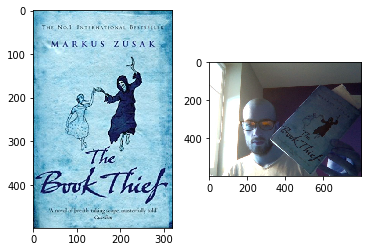

In [54]:
displayImages(book,book_person_holding)

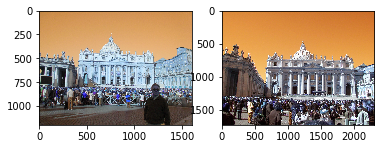

In [53]:
displayImages(roma_1,roma_2)

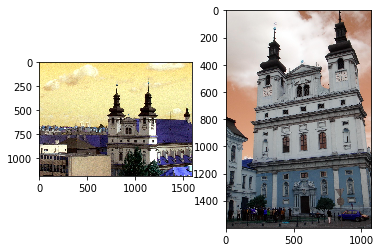

In [55]:
displayImages(building_1,building_2)

**SIFT**

***Function to find and draw matches***

In [0]:
def similarityBySift(img1,img2):

  # Initiate SIFT detector
  sift = cv2.xfeatures2d.SIFT_create()
  # find the keypoints and descriptors with SIFT
  kp1, des1 = sift.detectAndCompute(img1,None)
  kp2, des2 = sift.detectAndCompute(img2,None)

  # create BFMatcher object
  bf = cv2.BFMatcher(cv2.NORM_L1,crossCheck=False)
  # Match descriptors.
  matches = bf.match(des1,des2)
  # Sort them in the order of their distance.
  matches = sorted(matches, key = lambda x:x.distance)
  # Draw first 10 matches.
  img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  plt.figure(figsize=(20,10))
  plt.imshow(img3),plt.show()


***Testing on 3 sets***

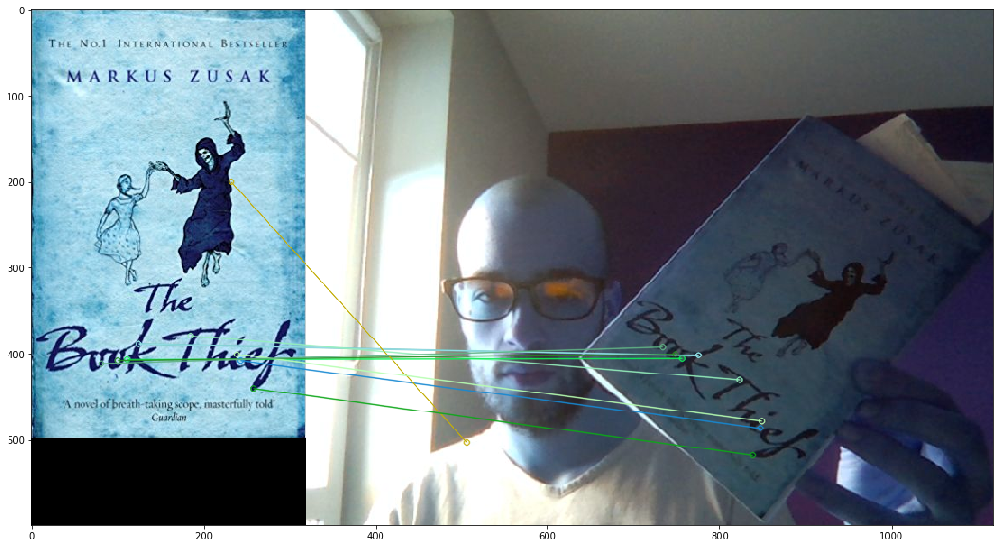

In [51]:
similarityBySift(book,book_person_holding)

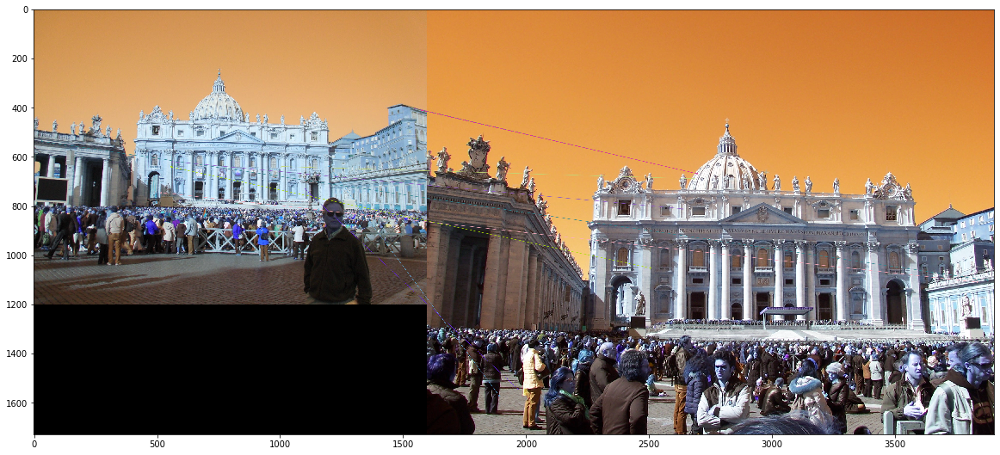

In [29]:
similarityBySift(roma_1,roma_2)

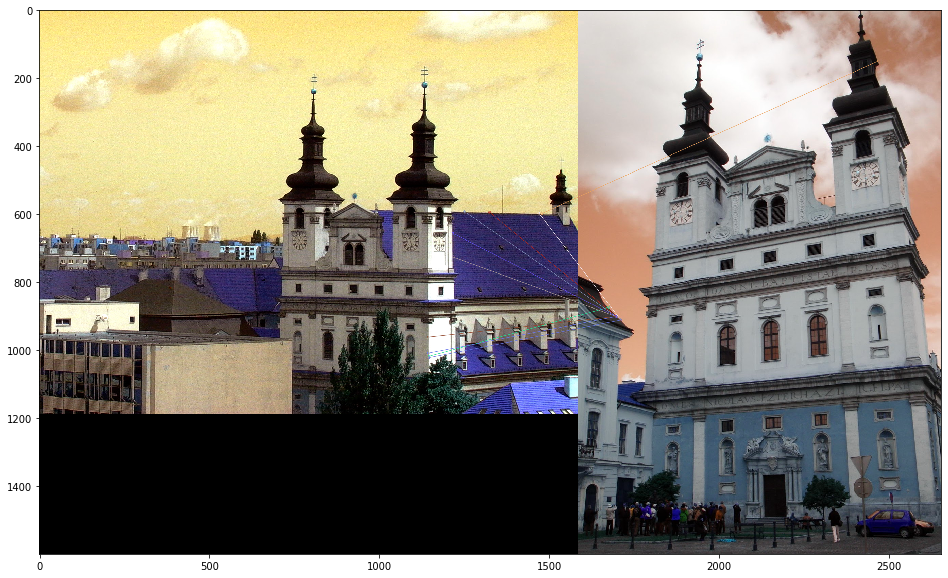

In [35]:
similarityBySift(building_1,building_2)

**SURF**

***Function to find and draw matches***

In [0]:
def similarityBySurf(img1,img2):

  #-- Step 1: Detect the keypoints using SURF Detector, compute the descriptors
  minHessian = 400
  detector = cv2.xfeatures2d_SURF.create(hessianThreshold=minHessian)
  keypoints1, descriptors1 = detector.detectAndCompute(img1, None)
  keypoints2, descriptors2 = detector.detectAndCompute(img2, None)
  #-- Step 2: Matching descriptor vectors with a FLANN based matcher
  # Since SURF is a floating-point descriptor NORM_L2 is used
  matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
  knn_matches = matcher.knnMatch(descriptors1, descriptors2, 2)
  #-- Filter matches using the Lowe's ratio test
  ratio_thresh = 0.8
  good_matches = []
  for m,n in knn_matches:
      if m.distance < ratio_thresh * n.distance:
          good_matches.append(m)

  # Sort them in the order of their distance.
  good_matches = sorted(good_matches, key = lambda x:x.distance)
  #-- Draw matches
  img_matches = np.empty((max(img1.shape[0], img2.shape[0]), img1.shape[1]+img2.shape[1], 3), dtype=np.uint8)
  cv2.drawMatches(img1, keypoints1, img2, keypoints2, good_matches[:10], img_matches, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  #-- Show detected matches
  plt.figure(figsize=(20,10))
  plt.imshow(img_matches),plt.show()


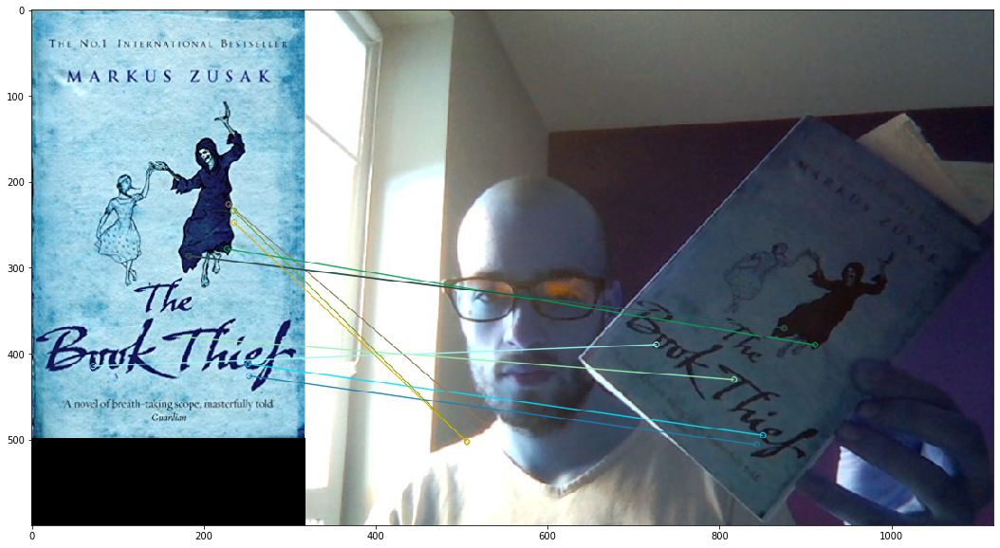

In [61]:
similarityBySurf(book,book_person_holding)

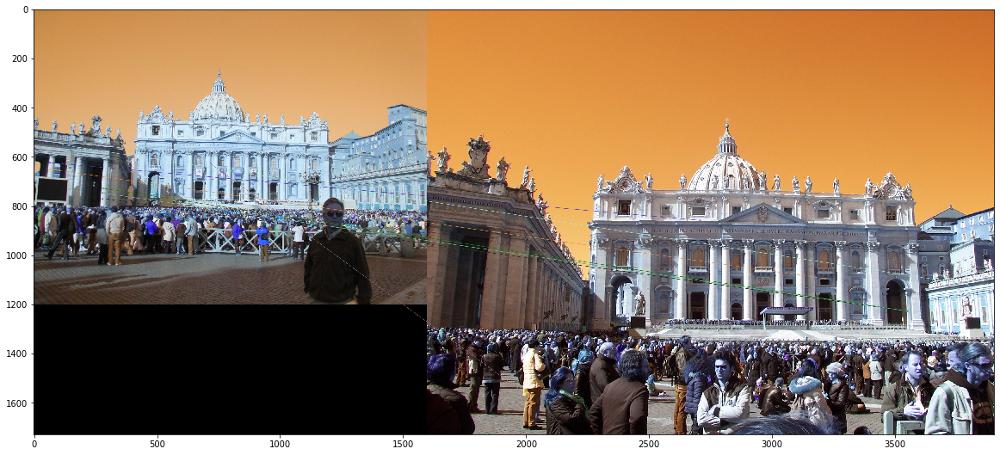

In [63]:
similarityBySurf(roma_1,roma_2)

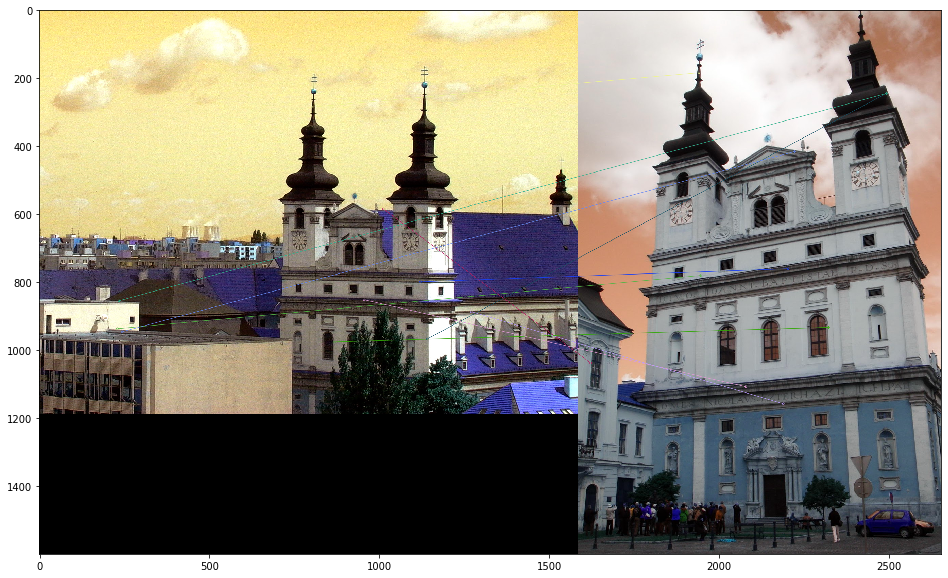

In [64]:
similarityBySurf(building_1,building_2)

**ORB**

***Function to find and draw matches***

In [0]:
def similarityByOrb(img1,img2):

  # Initiate ORB detector
  orb = cv2.ORB_create()
  # find the keypoints and descriptors with ORB
  kp1, des1 = orb.detectAndCompute(img1,None)
  kp2, des2 = orb.detectAndCompute(img2,None)

  # create BFMatcher object
  bf = cv2.BFMatcher(cv2.NORM_L1,crossCheck=False)
  # Match descriptors.
  matches = bf.match(des1,des2)
  # Sort them in the order of their distance.
  matches = sorted(matches, key = lambda x:x.distance)
  # Draw first 10 matches.
  img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches[:10],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  plt.figure(figsize=(20,10))
  plt.imshow(img3),plt.show()

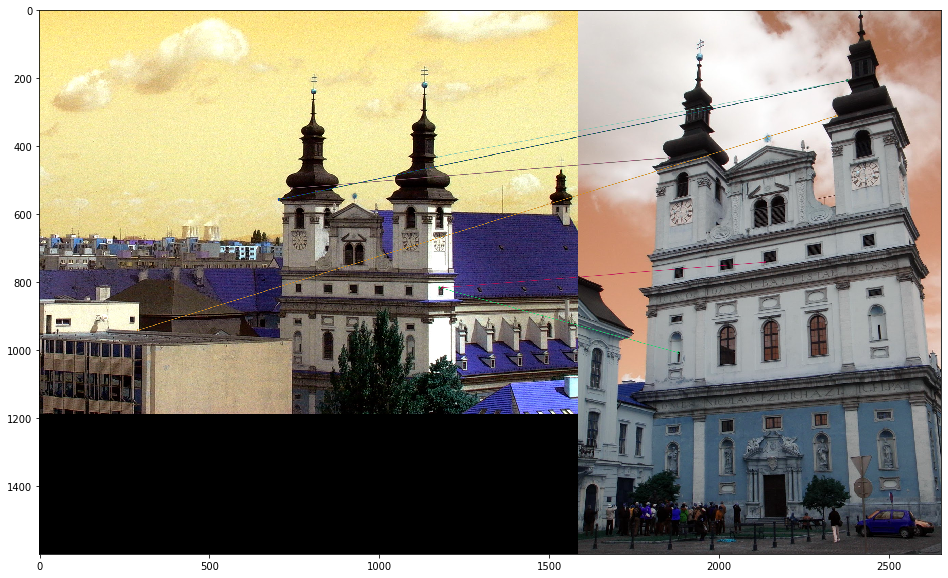

In [66]:
similarityByOrb(building_1,building_2)

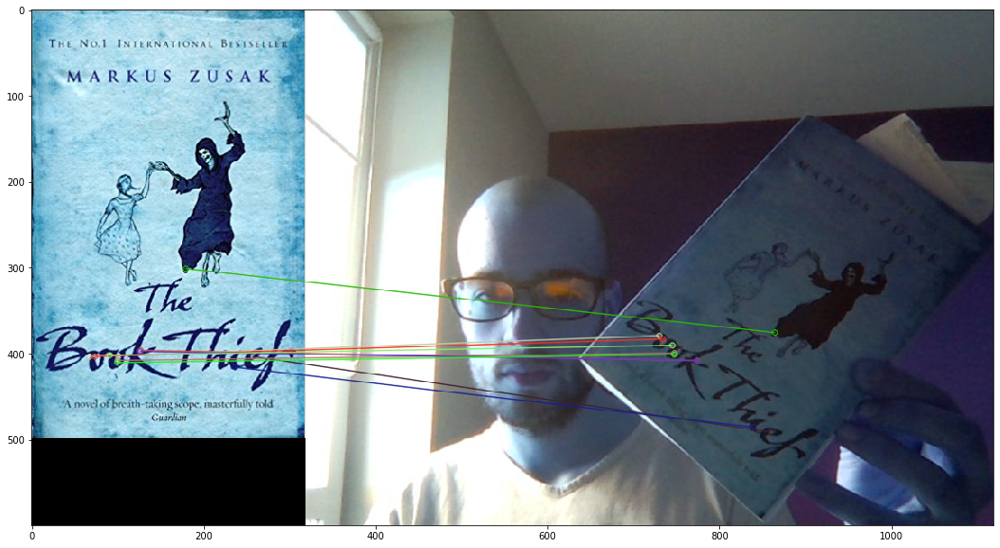

In [67]:
similarityByOrb(book,book_person_holding)

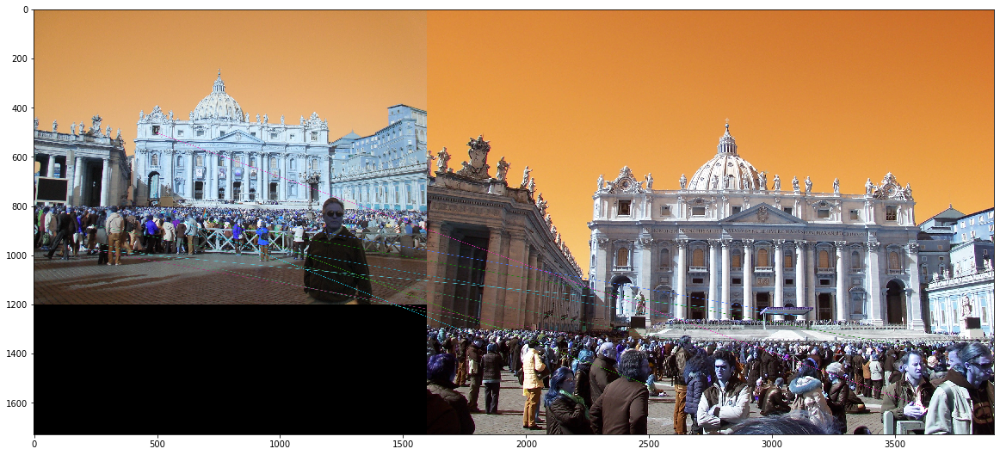

In [68]:
similarityByOrb(roma_1,roma_2)